## Patching experiment

In [1]:
import pandas as pd
from transformers import AutoModelForCausalLM, AutoTokenizer, pipeline
from collections import defaultdict
import os
import pickle
from tqdm import tqdm

In [2]:
# model_name = 'llama-13B-GPTQ-4bit'
# model_name = 'llama-2-13B-GPTQ-4bit'
model_name = 'mistral-GPTQ-4bit'
device='cuda:0'

In [3]:
model_name_or_path = f'/storage/models/{model_name}'
model = AutoModelForCausalLM.from_pretrained(model_name_or_path, device_map="cuda:0")
tokenizer = AutoTokenizer.from_pretrained(model_name_or_path)

In [4]:
prompt = """The Spanish word 'jirafa' means 'giraffe'. This statement is: TRUE [...]
The Spanish word 'aire' means 'silver'. This statement is: FALSE
The Spanish word 'uno' means 'floor'. This statement is:"""

input_ids_orig = tokenizer(prompt, return_tensors='pt').input_ids.cuda()
output_orig = model(input_ids_orig, output_hidden_states=True, output_attentions=True)
input_ids_mod = tokenizer(prompt.replace('floor', 'one'), return_tensors='pt').input_ids.cuda()
output_mod = model(input_ids_mod, output_hidden_states=True)

In [5]:
# get the original pd
import torch
true_token = tokenizer(f'TRUE', return_tensors='pt').input_ids[0][1]
false_token = tokenizer(f'FALSE', return_tensors='pt').input_ids[0][1]
orig_logits = torch.nn.functional.softmax(output_orig.logits[0, -1, :], dim=0)
orig_pd = orig_logits[true_token].item() - orig_logits[false_token].item()
orig_pd

-0.9998523134335642

In [6]:
from collections import defaultdict

for module in model.model.layers:
    module._forward_hooks.clear()
    
num_hidden_states = len(output_mod.hidden_states)
num_input_ids = len(input_ids_orig[0])
mod_pds = defaultdict(dict)
for layer in tqdm(range(0, num_hidden_states-1)):
    for input_idx in range(num_input_ids-11, num_input_ids): 
        hidden_state_mod = output_mod.hidden_states[layer+1][0, input_idx, :]
        def hook(m, input, op):
            op[0][0, input_idx, :] = hidden_state_mod
            return op
        h = model.model.layers[layer].register_forward_hook(hook) 
        mod_output = model(input_ids_orig)
        mod_logits = torch.nn.functional.softmax(mod_output.logits[0, -1, :], dim=0)
        mod_pd = mod_logits[true_token].item() - mod_logits[false_token].item()
        mod_pds[layer][input_idx] = mod_pd
        h.remove()
        

100%|██████████| 32/32 [00:42<00:00,  1.33s/it]


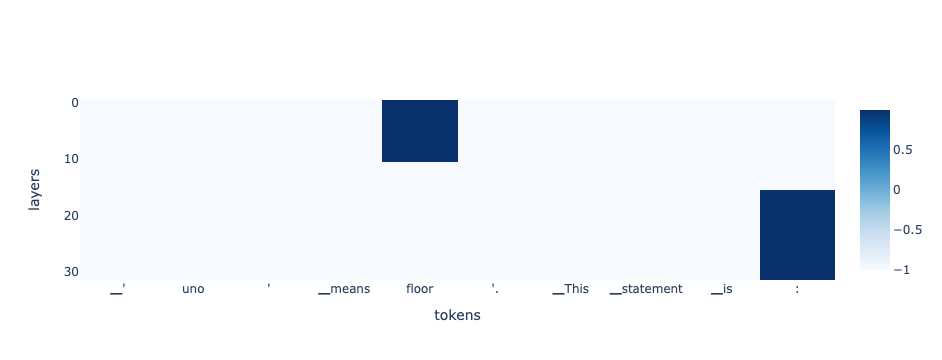

In [7]:
import plotly.graph_objects as go


rows = sorted(mod_pds.keys(), reverse=True)
columns = sorted(next(iter(mod_pds.values())).keys())
tokens = tokenizer.convert_ids_to_tokens(tokenizer(prompt, return_tensors='pt').input_ids[0])
plotly_matrix = [[mod_pds[row][col] for col in columns] for row in rows]
fig = go.Figure(go.Heatmap(z=plotly_matrix, x=tokens[columns[0]:], y=rows, colorscale='Blues'))
fig.update_layout(xaxis=dict(title='tokens'),
                  yaxis=dict(title='layers',
                autorange="reversed"))

fig.show()

In [13]:
attentions = output_orig['attentions']

In [180]:
# for a specific head
head = 0
token = -1
final_token_attentions = []
for layer in range(len(attentions)):
    final_token_attention = torch.nn.functional.softmax(attentions[layer][0][head][token, 1:], dim=0)
    final_token_attentions.append(final_token_attention)
final_token_attentions = torch.stack(final_token_attentions).cpu()

In [129]:
# for mean heads

mean_attentions = torch.mean(torch.stack(attentions), dim=2)
final_token_attentions = []
for layer in range(len(mean_attentions)):
    final_token_attention = mean_attentions[layer][0][-1, :]
    final_token_attentions.append(final_token_attention)
final_token_attentions = torch.stack(final_token_attentions).cpu()

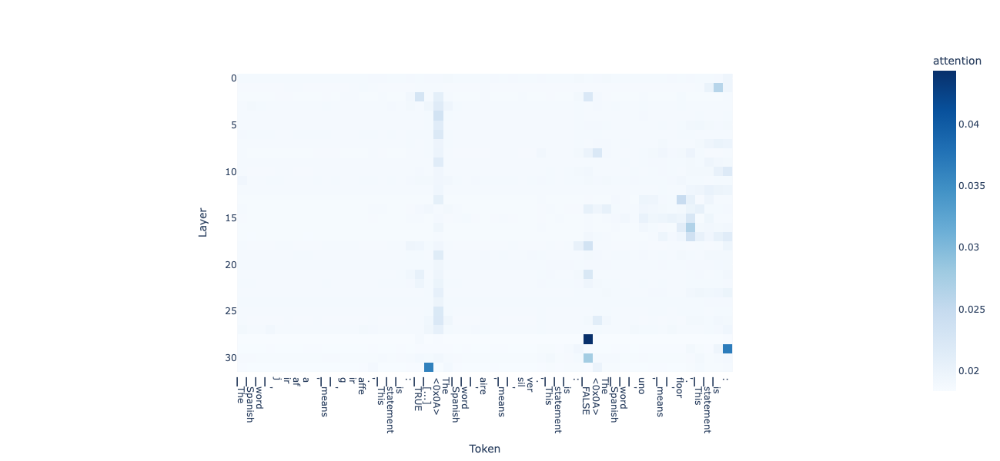

In [183]:
import plotly.express as px

fig = px.imshow(final_token_attentions, color_continuous_scale='blues', labels=dict(x="Token", y="Layer", color="attention"))
fig.update_xaxes(
    tickvals=list(range(len(tokens[1:]))),
    ticktext=tokens[1:]
)
fig.update_layout(
    width=1400,
    height=600,
)

fig.show()

/tmp/ipykernel_248/1865174179.py:7: UserWarning:

Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.



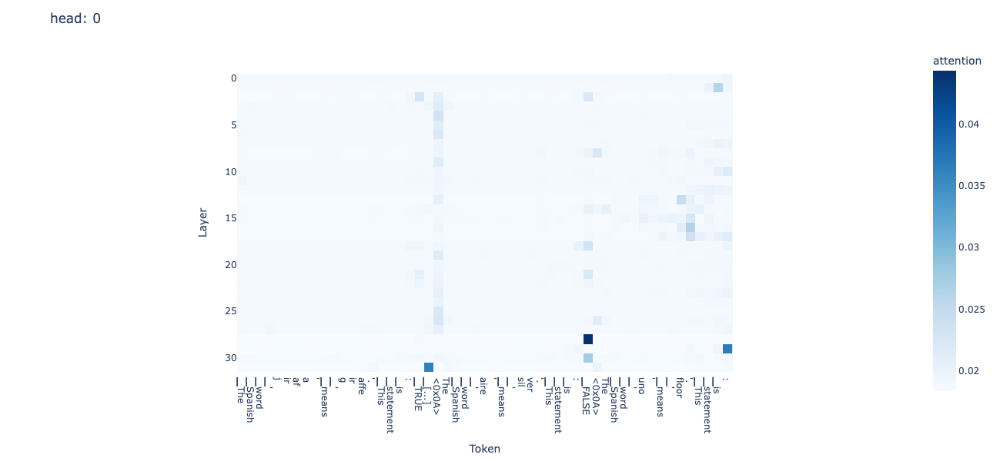

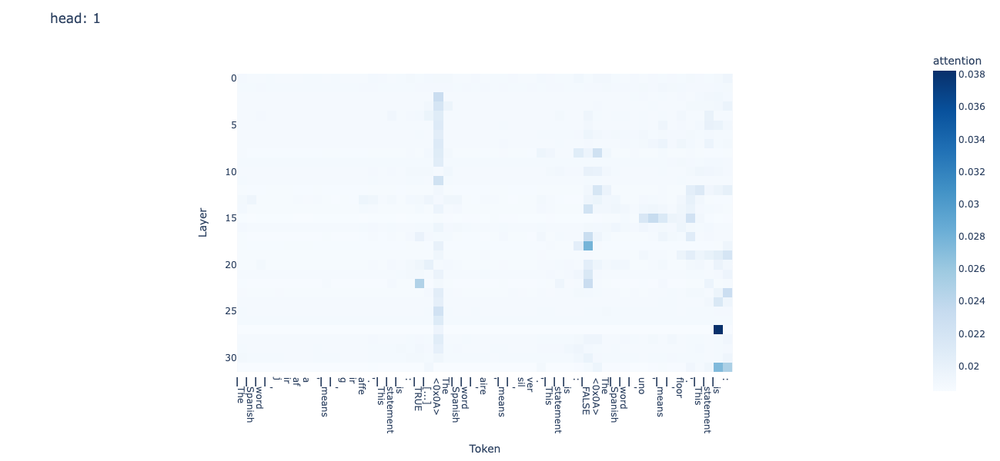

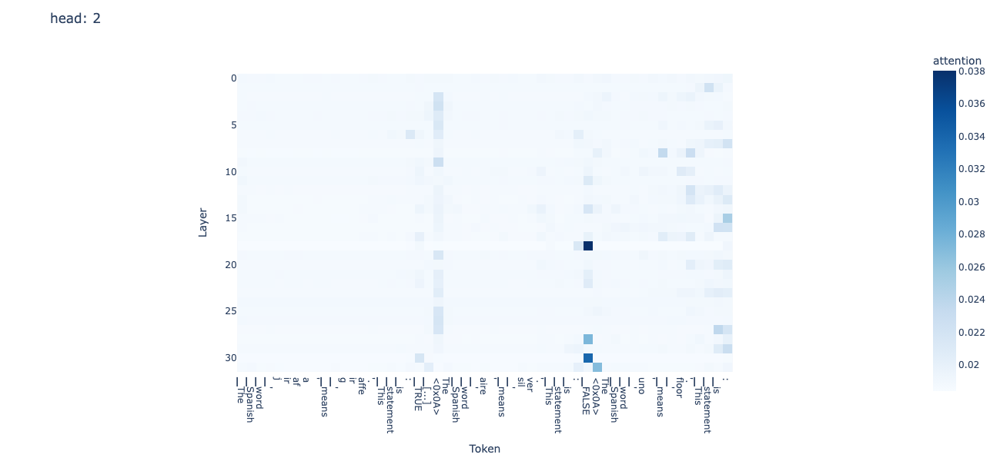

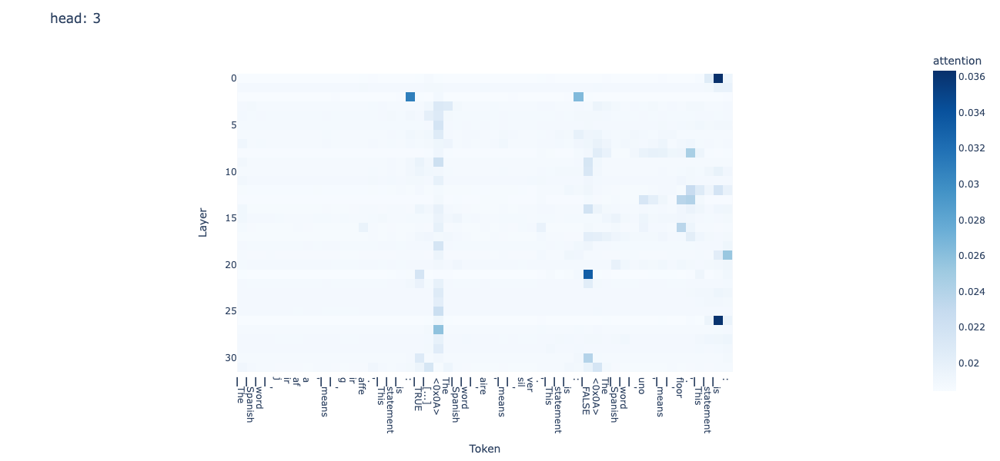

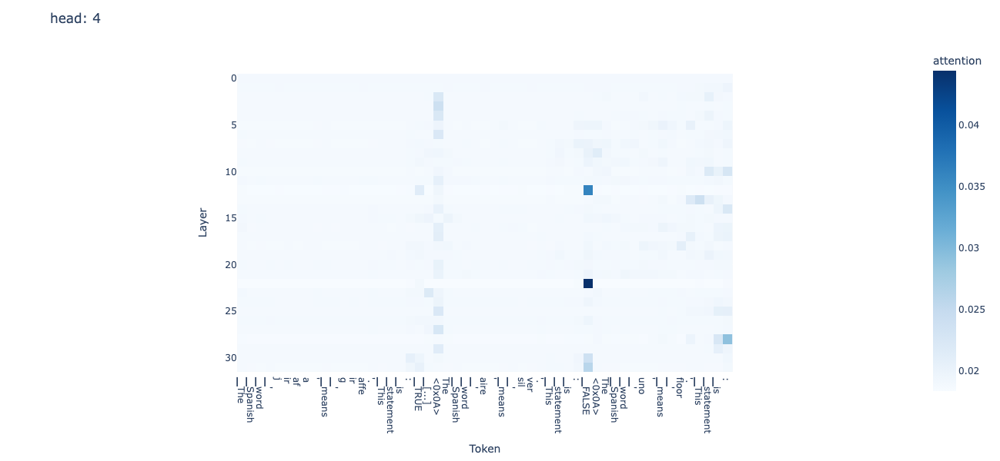

...

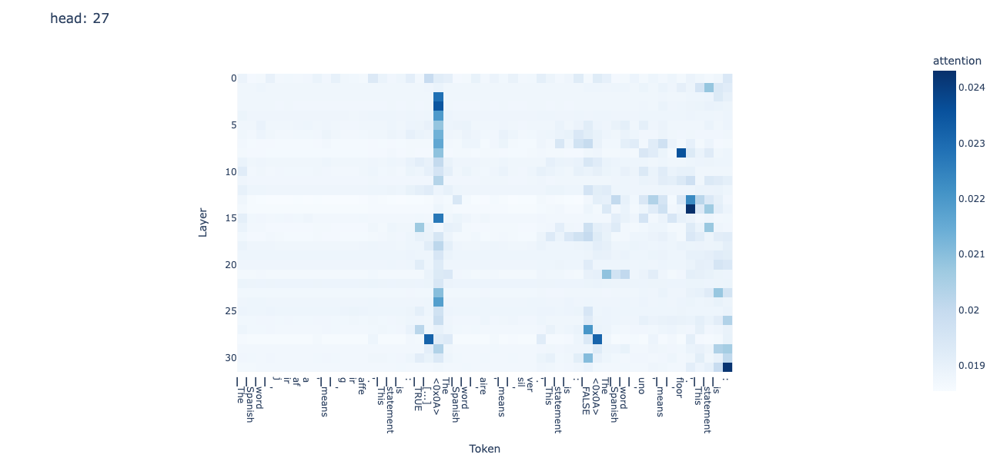

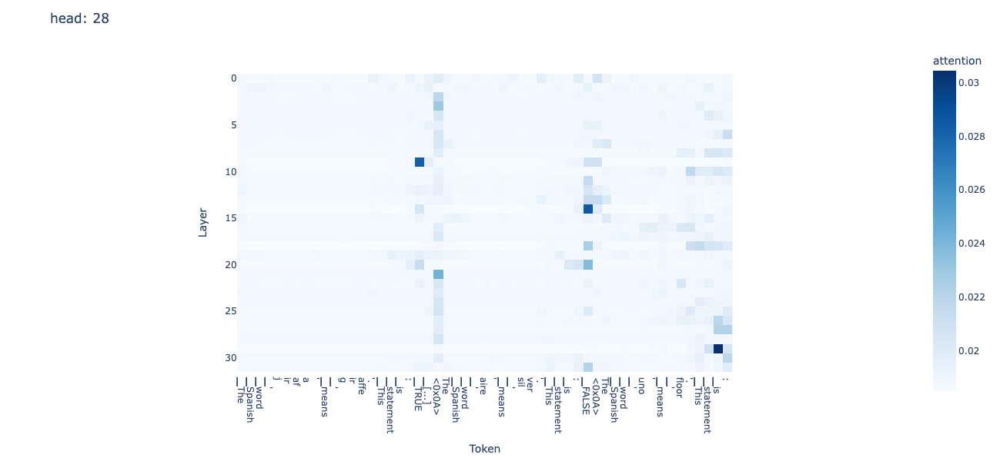

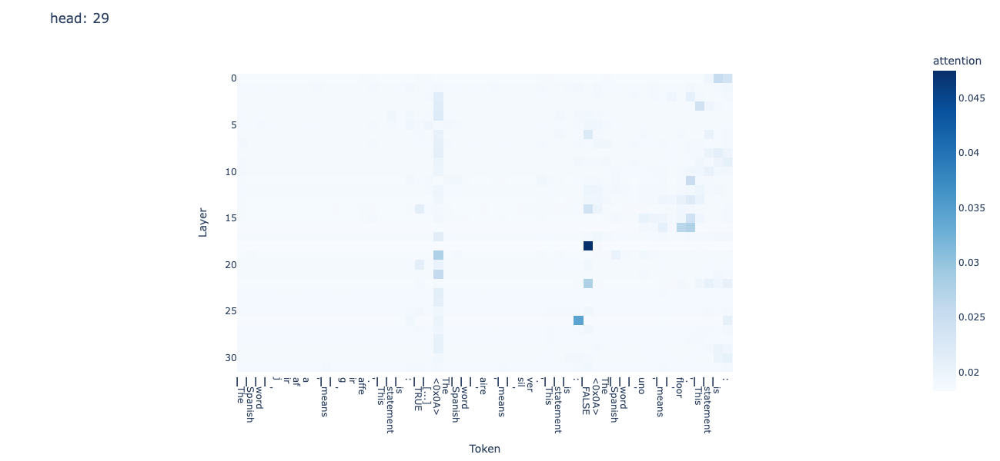

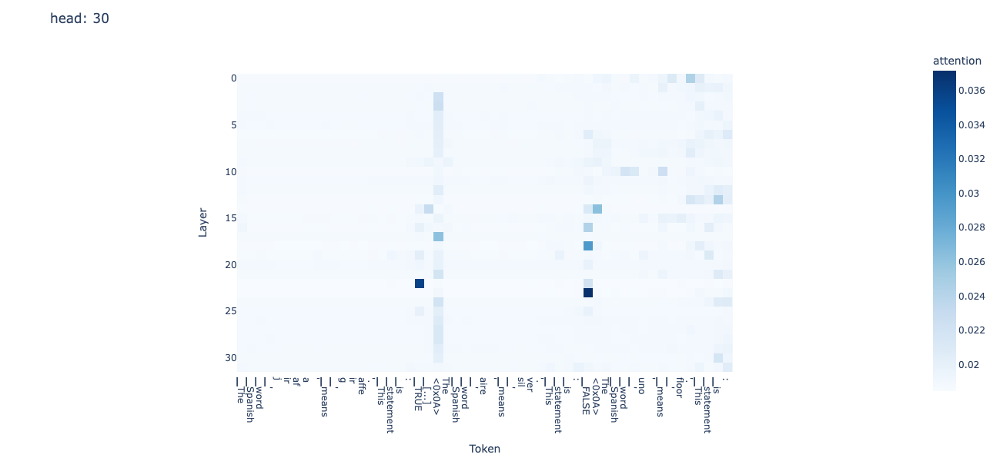

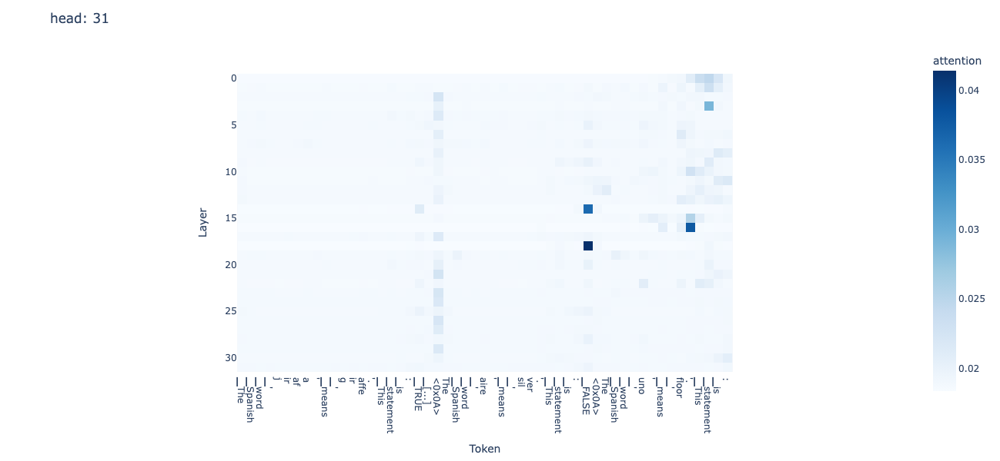

In [184]:
from torch.nn.functional import softmax

layer = 0
for head in range(model.model.config.num_attention_heads):
    final_token_attentions = []
    for layer in range(len(attentions)):
        final_token_attention = softmax(attentions[layer][0][head][-1, 1:])
        final_token_attentions.append(final_token_attention)
    final_token_attentions = torch.stack(final_token_attentions).cpu()
    
    fig = px.imshow(final_token_attentions, color_continuous_scale='blues', labels=dict(x="Token", y="Layer", color="attention"))
    fig.update_xaxes(
        tickvals=list(range(len(tokens[1:]))),
        ticktext=tokens[1:]
    )
    fig.update_layout(
        title=f'head: {head}',
        width=1400,
        height=600,
    )

    fig.show()